# Oceanstream Tour

### Setting up project root for module imports in Jupyter Notebook

In [1]:
# Import the os module to work with the file system
import os

# Get the absolute path of the current notebook.
# This assumes the notebook's name is "oceanstream_tour.ipynb".
# Note: "oceanstream_tour.ipynb" is located in the "notebooks" folder of the "oceanstream" repo.
# This folder is typically ignored to maintain a clear organization of the project.
notebook_path = os.path.abspath("oceanstream_tour.ipynb")
notebooks_folder_path = os.path.abspath(os.path.join(notebook_path, os.pardir))
# Navigate up two directories from the notebook's path to get to the project root
project_root = os.path.abspath(os.path.join(notebook_path, os.pardir, os.pardir))

# Import the sys module to modify the Python path
import sys

# Append the project root to the Python path so that modules from the project can be imported
sys.path.append(project_root)

**Specifies the path to the test data utilized in this notebook:**

In [2]:
oceanstream_tour_path = os.path.join(notebooks_folder_path, "test_data", "oceanstream_tour")
oceanstream_tour_path

'/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour'

### Imports

In [3]:
import gc
import os
import urllib.request

import echopype.visualize as epviz
import fsspec
import matplotlib.pyplot as plt

from oceanstream.L0_unprocessed_data import raw_reader, ensure_time_continuity
from oceanstream.L2_calibrated_data import (
    sv_computation,
    sv_dataset_extension,
    noise_masks,
    sv_interpolation,
    processed_data_io
)
from oceanstream.L3_regridded_data import (
    applying_masks_handler,
    nasc_computation,
    frequency_differencing_handler,
    shoal_detection_handler
)
from oceanstream.L3_regridded_data.applying_masks_handler import apply_mask_organisms_in_order
from oceanstream.L3_regridded_data.mvbs_computation import compute_mvbs
from oceanstream.utils import add_metadata_to_mask, attach_mask_to_dataset, dict_to_formatted_list

In [4]:
# Load the memory_profiler extension to enable memory usage profiling in the notebook
%load_ext memory_profiler

### Downloads the test files

In [5]:
# Initialize the S3 filesystem using anonymous access
fs = fsspec.filesystem('s3', anon=True)

bucket = "ncei-wcsd-archive"
rawdirpath = "data/raw/Bell_M._Shimada/SH1707/EK60"

# List files in the S3 directory
s3_files = fs.glob(f"{bucket}/{rawdirpath}/*")

# Filter the files based on your criteria (e.g., containing a specific string)
target_files = [s3path for s3path in s3_files if any([f"D2017{dtstr}" in s3path for dtstr in ['0728-T18', '0728-T19']])]

print(f"There are {len(target_files)} target files available")


There are 15 target files available


In [6]:
local_folder = oceanstream_tour_path

# Create the local folder if it doesn't exist
os.makedirs(local_folder, exist_ok=True)

# Download the filtered files to the local folder
for s3path in target_files:
    file_name = os.path.basename(s3path)
    local_file_path = os.path.join(local_folder, file_name)
    with fs.open(s3path, 'rb') as s3_file, open(local_file_path, 'wb') as local_file:
        local_file.write(s3_file.read())

print(f"Downloaded {len(target_files)} target raw files to {local_folder}")

Downloaded 15 target raw files to /Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour


### Files manipulation

**File finder**

In [7]:
# Displays all `.raw` files from the "oceanstream_tour" directory
raw_files_path = raw_reader.file_finder(oceanstream_tour_path, file_type='raw')
display(raw_files_path)

['/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T181619.raw',
 '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T184131.raw',
 '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T190728.raw',
 '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T193459.raw',
 '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T195219.raw']

**File integrity checker**

In [8]:
# Verifies if the provided echo sounder files are
# readable by echopype and extracts
# essential metadata such as the campaign ID, date of measurement,
# and sonar model.
raw_files_ck = []
for file_path in raw_files_path:
    raw_files_ck.append(raw_reader.file_integrity_checking(file_path))
    
raw_files_ck

[{'file_path': '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T181619.raw',
  'campaign_id': 'Summer2017',
  'date': datetime.datetime(2017, 7, 28, 18, 16, 19),
  'sonar_model': 'EK60',
  'file_integrity': True},
 {'file_path': '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T184131.raw',
  'campaign_id': 'Summer2017',
  'date': datetime.datetime(2017, 7, 28, 18, 41, 31),
  'sonar_model': 'EK60',
  'file_integrity': True},
 {'file_path': '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T190728.raw',
  'campaign_id': 'Summer2017',
  'date': datetime.datetime(2017, 7, 28, 19, 7, 28),
  'sonar_model': 'EK60',
  'file_integrity': True},
 {'file_path': '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T193459.raw',
  'campaign_id': 'Summ

**Checked raw files reader**

In [9]:
# Reads multiple raw echo sounder files and returns a list of Datasets.
summer2017_ds = raw_reader.read_raw_files(raw_files_ck)
summer2017_ds

[<EchoData: standardized raw data from Internal Memory>
 Top-level: contains metadata about the SONAR-netCDF4 file format.
 ├── Environment: contains information relevant to acoustic propagation through water.
 ├── Platform: contains information about the platform on which the sonar is installed.
 │   └── NMEA: contains information specific to the NMEA protocol.
 ├── Provenance: contains metadata about how the SONAR-netCDF4 version of the data were obtained.
 ├── Sonar: contains sonar system metadata and sonar beam groups.
 │   └── Beam_group1: contains backscatter power (uncalibrated) and other beam or channel-specific data, including split-beam angle data when they exist.
 └── Vendor_specific: contains vendor-specific information about the sonar and the data.,
 <EchoData: standardized raw data from Internal Memory>
 Top-level: contains metadata about the SONAR-netCDF4 file format.
 ├── Environment: contains information relevant to acoustic propagation through water.
 ├── Platform: co

**File similarity grouper**

In [10]:
# Splits a list of file information dictionaries into sublists based on their similarity.
splited_files_info = raw_reader.split_files(raw_files_ck)
splited_files_info

[[{'file_path': '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T181619.raw',
   'campaign_id': 'Summer2017',
   'date': datetime.datetime(2017, 7, 28, 18, 16, 19),
   'sonar_model': 'EK60',
   'file_integrity': True},
  {'file_path': '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T184131.raw',
   'campaign_id': 'Summer2017',
   'date': datetime.datetime(2017, 7, 28, 18, 41, 31),
   'sonar_model': 'EK60',
   'file_integrity': True},
  {'file_path': '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T190728.raw',
   'campaign_id': 'Summer2017',
   'date': datetime.datetime(2017, 7, 28, 19, 7, 28),
   'sonar_model': 'EK60',
   'file_integrity': True},
  {'file_path': '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T193459.raw',
   'ca

### Time continuity checker

In [11]:
for ds in summer2017_ds:
    if ensure_time_continuity.check_reversed_time(ds, "Sonar/Beam_group1", "ping_time") == True:
        print(ds)

### NetCDF files obtained from raw files

**Raw file converter to 'nc' or 'zarr'**

In [12]:
raw_reader.convert_raw_files(raw_files_ck, oceanstream_tour_path, save_file_type='nc')

['/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T181619.nc',
 '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T184131.nc',
 '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T190728.nc',
 '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T193459.nc',
 '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T195219.nc']

**File finder**

In [13]:
# Displays all `.nc` files from the "oceanstream_tour" directory
nc_files_path = raw_reader.file_finder(oceanstream_tour_path, file_type='nc')
nc_files_path

['/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T181619.nc',
 '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T184131.nc',
 '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T190728.nc',
 '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T193459.nc',
 '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T195219.nc']

**File integrity checker**

In [14]:
nc_files_ck = []
for file_path in nc_files_path:
    nc_files_ck.append(raw_reader.file_integrity_checking(file_path))
    
nc_files_ck

[{'file_path': '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T181619.nc',
  'campaign_id': 'Summer2017',
  'date': datetime.datetime(2017, 7, 28, 18, 16, 19),
  'sonar_model': 'EK60',
  'file_integrity': True},
 {'file_path': '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T184131.nc',
  'campaign_id': 'Summer2017',
  'date': datetime.datetime(2017, 7, 28, 18, 41, 31),
  'sonar_model': 'EK60',
  'file_integrity': True},
 {'file_path': '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T190728.nc',
  'campaign_id': 'Summer2017',
  'date': datetime.datetime(2017, 7, 28, 19, 7, 28),
  'sonar_model': 'EK60',
  'file_integrity': True},
 {'file_path': '/Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170728-T193459.nc',
  'campaign_id': 'Summer20

**Processed files reader**

In [15]:
summer2017_ds_nc = raw_reader.read_processed_files(nc_files_path)

In [16]:
for ds in summer2017_ds_nc:
    if ensure_time_continuity.check_reversed_time(ds, "Sonar/Beam_group1", "ping_time") == True:
        print(ds)

### Files concatenator

In [17]:
ds = raw_reader.concatenate_files(nc_files_ck)
ensure_time_continuity.check_reversed_time(ds, "Sonar/Beam_group1", "ping_time")

False

### Sv (Volume backscattering strength) computation

In [18]:
sv = sv_computation.compute_sv(ds)
sv

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 2379,
                                    range_sample: 3957, filenames: 1)
Coordinates:
  * channel                        (channel) <U37 'GPT  18 kHz 009072058c8d 1...
  * ping_time                      (ping_time) datetime64[ns] 2017-07-28T18:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 3954 3955 3956
  * filenames                      (filenames) int64 0
Data variables: (12/16)
    Sv                             (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.7 ... -0.3
    ...                             ...
    angle_sensitivity_alongship    (channel) float64 13.89 21.97 23.12
    angle_sensitivity_athwartship  (channel) float64 13.89 21.97 23.12
    beamwidth_alongship            (channel) float64 10.9 6.81 6.58
    beamwidth_athwartship          (channel) float64 10.82 6.85 6.52
    source_filenames               (filenames) <U26 'SOURCE FILE NOT IDENTIFIED'
    water_level                    float64 9.15
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2333+gc260127
    processing_time:              2023-11-10T07:37:45Z
    processing_function:          calibrate.compute_Sv

**Sv - with noise**

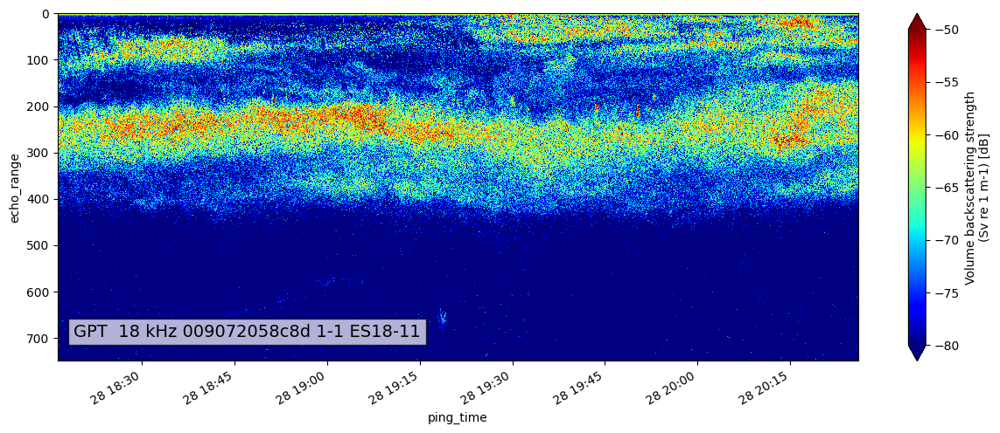

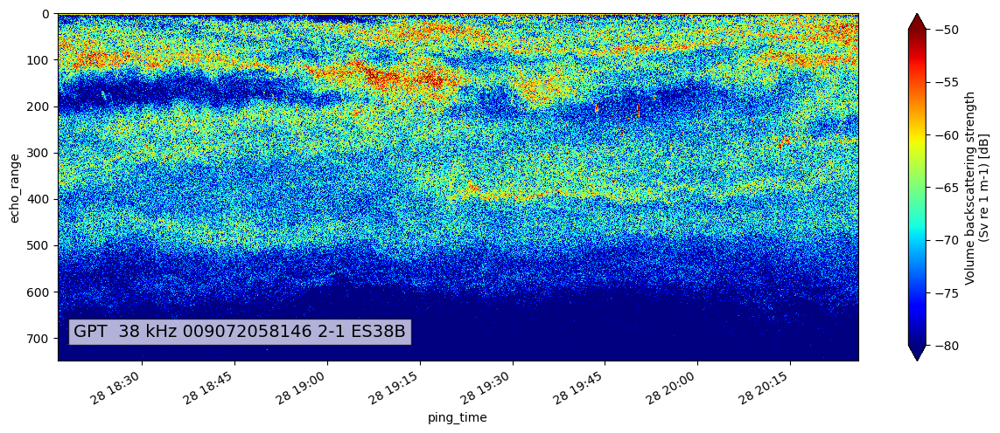

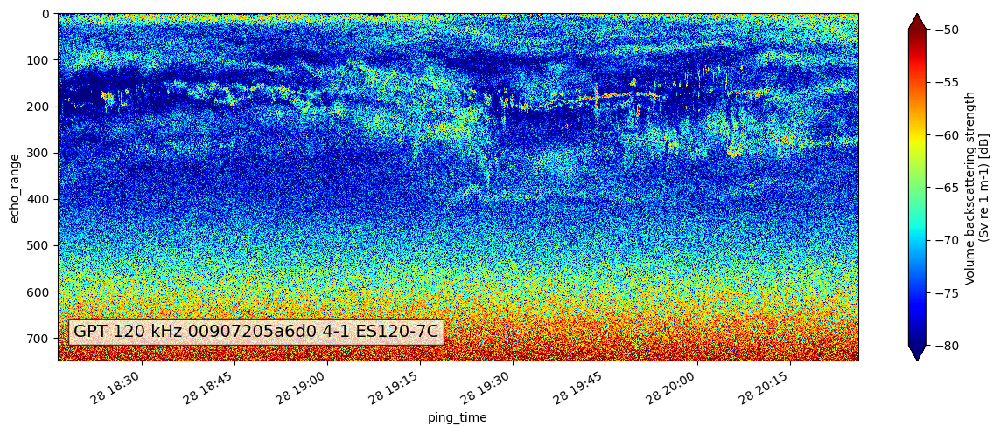

In [19]:
epviz.create_echogram(sv,vmin=-80,vmax=-50)

### Sv dataset extension

In [20]:
extended_sv = sv_dataset_extension.enrich_sv_dataset(sv = sv, 
                                                     echodata = ds, 
                                                     waveform_mode="CW", 
                                                     encode_mode="power")
extended_sv

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 2379,
                                    range_sample: 3957, filenames: 1)
Coordinates:
  * channel                        (channel) <U37 'GPT  18 kHz 009072058c8d 1...
  * ping_time                      (ping_time) datetime64[ns] 2017-07-28T18:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 3954 3955 3956
  * filenames                      (filenames) int64 0
Data variables: (12/21)
    Sv                             (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.7 ... -0.3
    ...                             ...
    water_level                    float64 9.15
    depth                          (channel, ping_time, range_sample) float64 ...
    latitude                       (ping_time) float64 nan 43.66 ... 43.77 43.78
    longitude                      (ping_time) float64 nan -124.9 ... -125.2
    angle_alongship                (channel, ping_time, range_sample) float64 ...
    angle_athwartship              (channel, ping_time, range_sample) float64 ...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2333+gc260127
    processing_time:              2023-11-10T07:37:45Z
    processing_function:          calibrate.compute_Sv
    processing_level:             Level 2A
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...

### Noise masks

For the noise masks part, we will repeat some of the steps above to obtain a dataset for analysis that contains a higher level of noise. This additional dataset with increased noise levels will allow us to explore and analyze the effects of noise on our results in greater detail.

In [21]:
# Downloads the test file
# -----------------------
bucket = "ncei-wcsd-archive"
base_path = "data/raw/Bell_M._Shimada/SH1707/EK60/"
filename = "Summer2017-D20170620-T011027.raw"

# URL of the file to download
url = f"https://{bucket}.s3.amazonaws.com/{base_path}{filename}"

# Specify the local folder where you want to download the file
local_folder = os.path.join(oceanstream_tour_path, 'Summer2017-D20170620-T011027')

# Create the local folder if it doesn't exist
os.makedirs(local_folder, exist_ok=True)

# Construct the local file path
file_name = os.path.basename(url)
local_file_path = os.path.join(local_folder, file_name)

# Download the file
try:
    urllib.request.urlretrieve(url, local_file_path)
    print(f"Downloaded {file_name} to {local_folder}")
except urllib.error.URLError as e:
    print(f"Failed to download the file: {e}")
    
# File manipulation
# -----------------
raw_ek60_file_ck = raw_reader.file_integrity_checking(
    os.path.join(oceanstream_tour_path,
                 "Summer2017-D20170620-T011027",
                 "Summer2017-D20170620-T011027.raw"
                )
)
ek60_ed = raw_reader.read_raw_files([raw_ek60_file_ck])
ek60_ed = ek60_ed[0]

# Time continuity checker
# -----------------------
ensure_time_continuity.check_reversed_time(ek60_ed, "Sonar/Beam_group1", "ping_time")

#  Sv (Volume backscattering strength) computation
# ------------------------------------------------
sv_60_ds = sv_computation.compute_sv(ek60_ed)

# Sv dataset extension
# --------------------
extended_sv_60_ds = sv_dataset_extension.enrich_sv_dataset(sv = sv_60_ds, 
                                                           echodata = ek60_ed, 
                                                           waveform_mode="CW", 
                                                           encode_mode="power")
extended_sv_60_ds

Downloaded Summer2017-D20170620-T011027.raw to /Users/simedroniraluca/Documents/pineview/oceanstream/notebooks/test_data/oceanstream_tour/Summer2017-D20170620-T011027


<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 1932,
                                    range_sample: 1055, filenames: 1)
Coordinates:
  * channel                        (channel) <U37 'GPT  18 kHz 009072058c8d 1...
  * ping_time                      (ping_time) datetime64[ns] 2017-06-20T01:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 1052 1053 1054
  * filenames                      (filenames) int64 0
Data variables: (12/21)
    Sv                             (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.83 ... -0.34
    ...                             ...
    water_level                    float64 9.15
    depth                          (channel, ping_time, range_sample) float64 ...
    latitude                       (ping_time) float64 nan 44.71 ... 44.7 44.7
    longitude                      (ping_time) float64 nan -124.3 ... -124.4
    angle_alongship                (channel, ping_time, range_sample) float64 ...
    angle_athwartship              (channel, ping_time, range_sample) float64 ...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2333+gc260127
    processing_time:              2023-11-10T07:38:30Z
    processing_function:          calibrate.compute_Sv
    processing_level:             Level 2A
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...

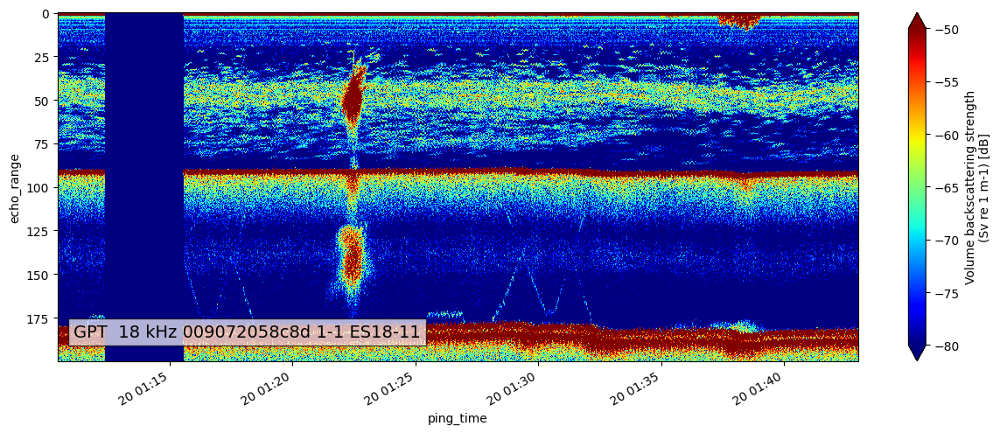

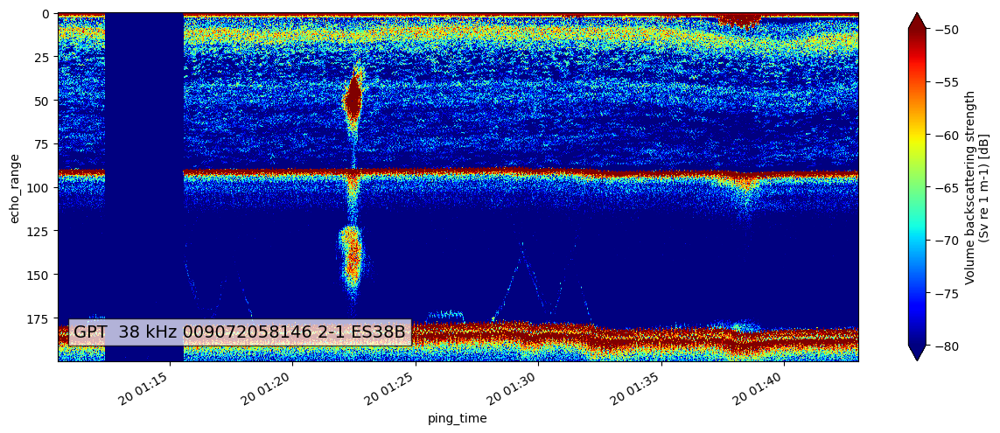

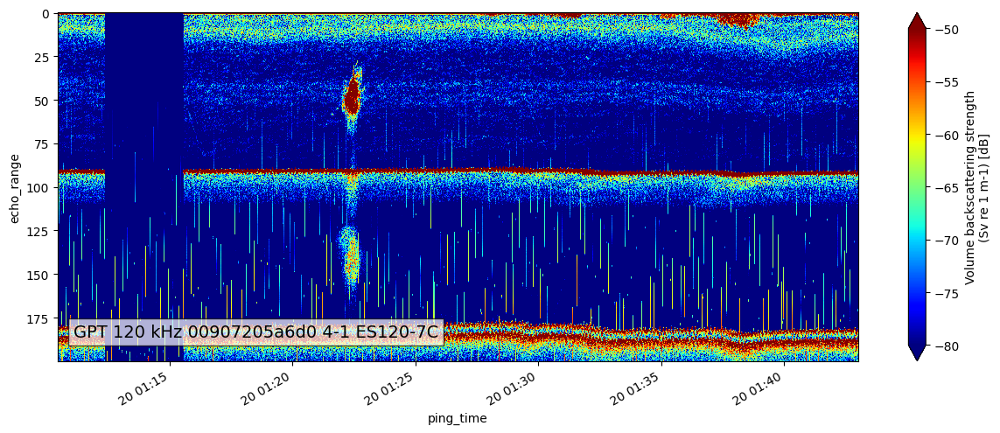

In [22]:
# Sv - ek60 - echogram - with noise
epviz.create_echogram(sv_60_ds,vmin=-80,vmax=-50)

- **Compute noise masks and add them as variables to the dataset (using `create_noise_masks_oceanstream` function)**
- Notes:
    - The `create_noise_masks_oceanstream` function is designed to generate noise masks and add them to a specific Sv dataset, utilizing default methods set by the oceanstream team for the foundational operations of oceanstream. This feature can be adjusted based on evaluations with various datasets. Within the mask attributes, the function provides insights into the methods employed for each distinct mask type.

In [23]:
%%time

%memit oceanstream_ek60_extended_ds = noise_masks.create_noise_masks_oceanstream(extended_sv_60_ds)
oceanstream_ek60_extended_ds

peak memory: 12005.81 MiB, increment: 7722.27 MiB
CPU times: user 2min 36s, sys: 3min 33s, total: 6min 10s
Wall time: 4min


<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 1932,
                                    range_sample: 1055, filenames: 1)
Coordinates:
  * channel                        (channel) object 'GPT  18 kHz 009072058c8d...
  * ping_time                      (ping_time) datetime64[ns] 2017-06-20T01:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 1052 1053 1054
  * filenames                      (filenames) int64 0
Data variables: (12/24)
    Sv                             (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.83 ... -0.34
    ...                             ...
    longitude                      (ping_time) float64 nan -124.3 ... -124.4
    angle_alongship                (channel, ping_time, range_sample) float64 ...
    angle_athwartship              (channel, ping_time, range_sample) float64 ...
    mask_transient                 (channel, ping_time, range_sample) bool dask.array<chunksize=(1, 100, 1055), meta=np.ndarray>
    mask_attenuation               (channel, ping_time, range_sample) bool Tr...
    mask_impulse                   (channel, ping_time, range_sample) bool Fa...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2333+gc260127
    processing_time:              2023-11-10T07:38:30Z
    processing_function:          calibrate.compute_Sv
    processing_level:             Level 2A
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...

- **Compute `seabed` and `false seabed` masks and add them as variables to the dataset**
- Notes:
   - To effectively utilize the `blackwell_mod` method for seabed detection, ensure that the `Sv` dataset includes the `split-beam angle` parameters. Specifically, the input `Sv` dataset should contain both the `angle_alongship` and `angle_athwartship` variables. The absence of these variables will lead to errors.

In [24]:
# `blackwell_mod`

BLACKWELL_MOD_DEFAULT_PARAMS = {
    "theta": None,
    "phi": None,
    "r0": 10,
    "r1": 1000,
    "tSv": -75,
    "ttheta": 702,
    "tphi": 282,
    "wtheta": 28,
    "wphi": 52,
    "rlog": None,
    "tpi": None,
    "freq": None,
    "rank": 50,
}
blackwell_mod_mask = noise_masks.create_seabed_mask(
    oceanstream_ek60_extended_ds,
    method="blackwell_mod",
    parameters = BLACKWELL_MOD_DEFAULT_PARAMS,
    )
blackwell_mod_mask = add_metadata_to_mask(
    mask=blackwell_mod_mask , 
    metadata={
        "mask_type": "false_seabed", 
        "method":"blackwell_mod",
        "parameters": dict_to_formatted_list(BLACKWELL_MOD_DEFAULT_PARAMS),
    }
)

oceanstream_ek60_extended_ds = attach_mask_to_dataset(
    oceanstream_ek60_extended_ds, 
    blackwell_mod_mask
)


# `ariza`

ARIZA_PARAMS = {
    "r0": 10,
    "r1": 1000,
    "roff": 0,
    "thr": -35,
    "ec": 15,
    "ek": (1, 3),
    "dc": 150,
    "dk": (1, 3),
}
ariza_mask = noise_masks.create_seabed_mask(
    oceanstream_ek60_extended_ds,
    method="ariza",
    parameters=ARIZA_PARAMS,
)
ariza_mask = add_metadata_to_mask(
    mask=ariza_mask,
    metadata={
        "mask_type": "seabed",
        "method": "ariza",
        "parameters": dict_to_formatted_list(ARIZA_PARAMS),
    },
)

oceanstream_ek60_extended_ds = attach_mask_to_dataset(
    oceanstream_ek60_extended_ds, 
    ariza_mask
)

oceanstream_ek60_extended_ds

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 1932,
                                    range_sample: 1055, filenames: 1)
Coordinates:
  * channel                        (channel) object 'GPT  18 kHz 009072058c8d...
  * ping_time                      (ping_time) datetime64[ns] 2017-06-20T01:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 1052 1053 1054
  * filenames                      (filenames) int64 0
Data variables: (12/26)
    Sv                             (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.83 ... -0.34
    ...                             ...
    angle_athwartship              (channel, ping_time, range_sample) float64 ...
    mask_transient                 (channel, ping_time, range_sample) bool dask.array<chunksize=(1, 100, 1055), meta=np.ndarray>
    mask_attenuation               (channel, ping_time, range_sample) bool Tr...
    mask_impulse                   (channel, ping_time, range_sample) bool Fa...
    mask_false_seabed              (channel, ping_time, range_sample) bool Tr...
    mask_seabed                    (channel, ping_time, range_sample) bool Tr...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2333+gc260127
    processing_time:              2023-11-10T07:38:30Z
    processing_function:          calibrate.compute_Sv
    processing_level:             Level 2A
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...

### Applying masks

**Applies the following masks to the dataset in the specified order:**

1. `Apply impulse noise mask`

2. `Apply attenuation mask `

3. `Apply transient mask`

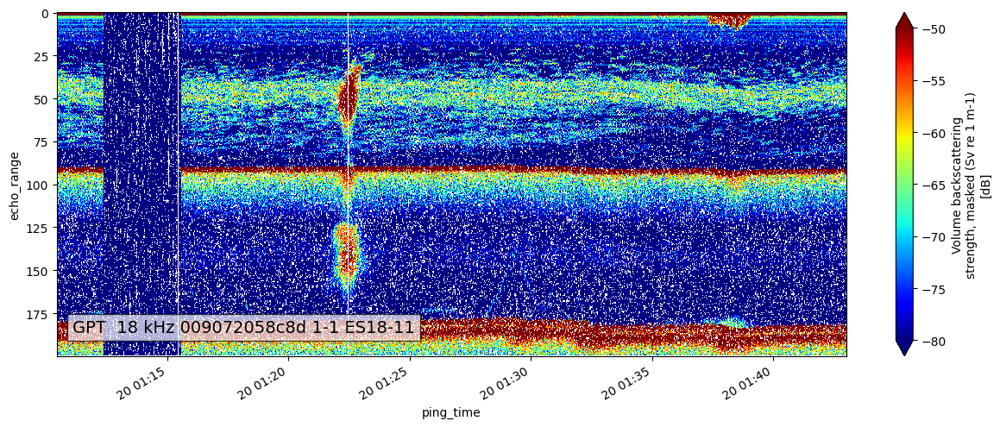

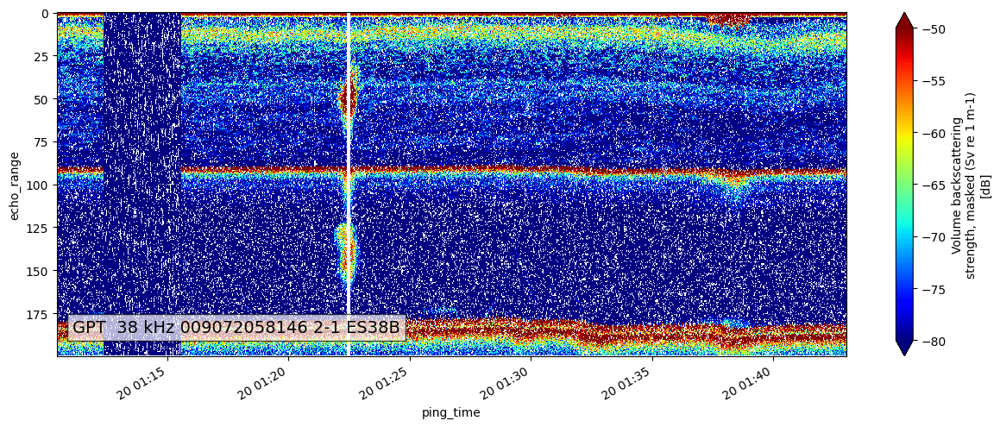

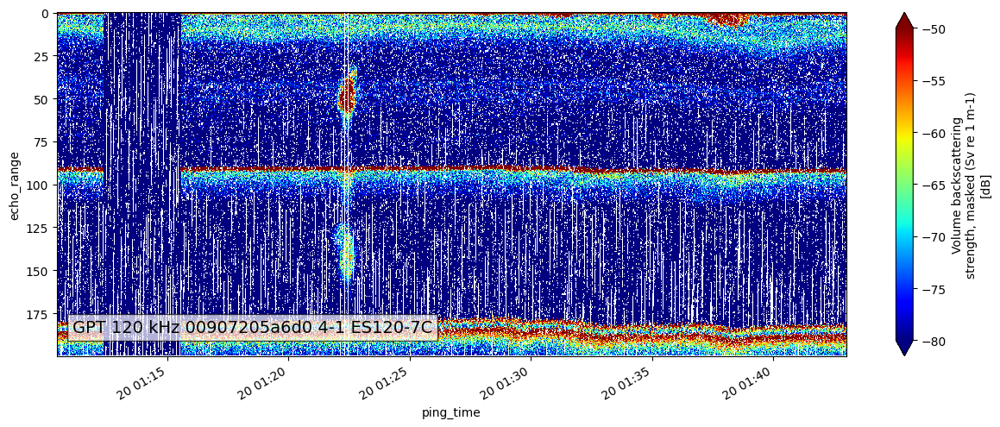

In [25]:
process_parameters = {
    "mask_transient": {
        "var_name": "Sv",
    },
    "mask_impulse": {
        "var_name": "Sv",
    },
    "mask_attenuation": {
        "var_name": "Sv",
    },
}
cleaned_ds = applying_masks_handler.apply_selected_noise_masks_and_or_noise_removal(
    oceanstream_ek60_extended_ds, 
    process_parameters
)
epviz.create_echogram(cleaned_ds,vmin=-80,vmax=-50)

### Sv interpolation

In [26]:
interpolated_ds = sv_interpolation.interpolate_sv(cleaned_ds)
interpolated_ds

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 1932,
                                    range_sample: 1055, filenames: 1)
Coordinates:
  * channel                        (channel) <U37 'GPT  18 kHz 009072058c8d 1...
  * ping_time                      (ping_time) datetime64[ns] 2017-06-20T01:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 1052 1053 1054
  * filenames                      (filenames) int64 0
Data variables: (12/27)
    Sv                             (channel, ping_time, range_sample) float64 dask.array<chunksize=(1, 100, 1055), meta=np.ndarray>
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.83 ... -0.34
    ...                             ...
    mask_transient                 (channel, ping_time, range_sample) bool dask.array<chunksize=(1, 100, 1055), meta=np.ndarray>
    mask_attenuation               (channel, ping_time, range_sample) bool Tr...
    mask_impulse                   (channel, ping_time, range_sample) bool Fa...
    mask_false_seabed              (channel, ping_time, range_sample) bool Tr...
    mask_seabed                    (channel, ping_time, range_sample) bool Tr...
    Sv_interpolated                (channel, ping_time, range_sample) float64 dask.array<chunksize=(1, 1932, 1055), meta=np.ndarray>
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2333+gc260127
    processing_time:              2023-11-10T07:38:30Z
    processing_function:          calibrate.compute_Sv
    processing_level:             Level 3A
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...
    mask_software_name:           echopype
    mask_software_version:        0.1.dev2333+gc260127
    mask_time:                    2023-11-10T07:43:29Z
    mask_function:                mask.apply_mask

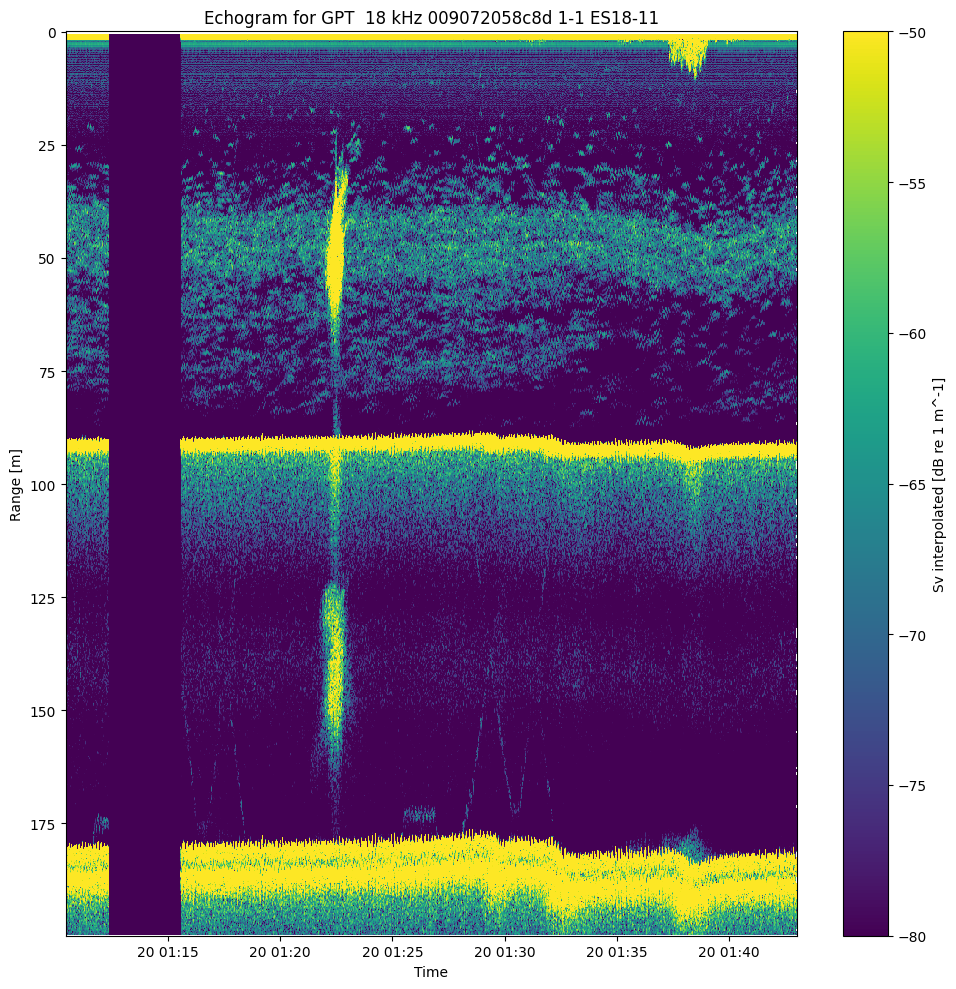

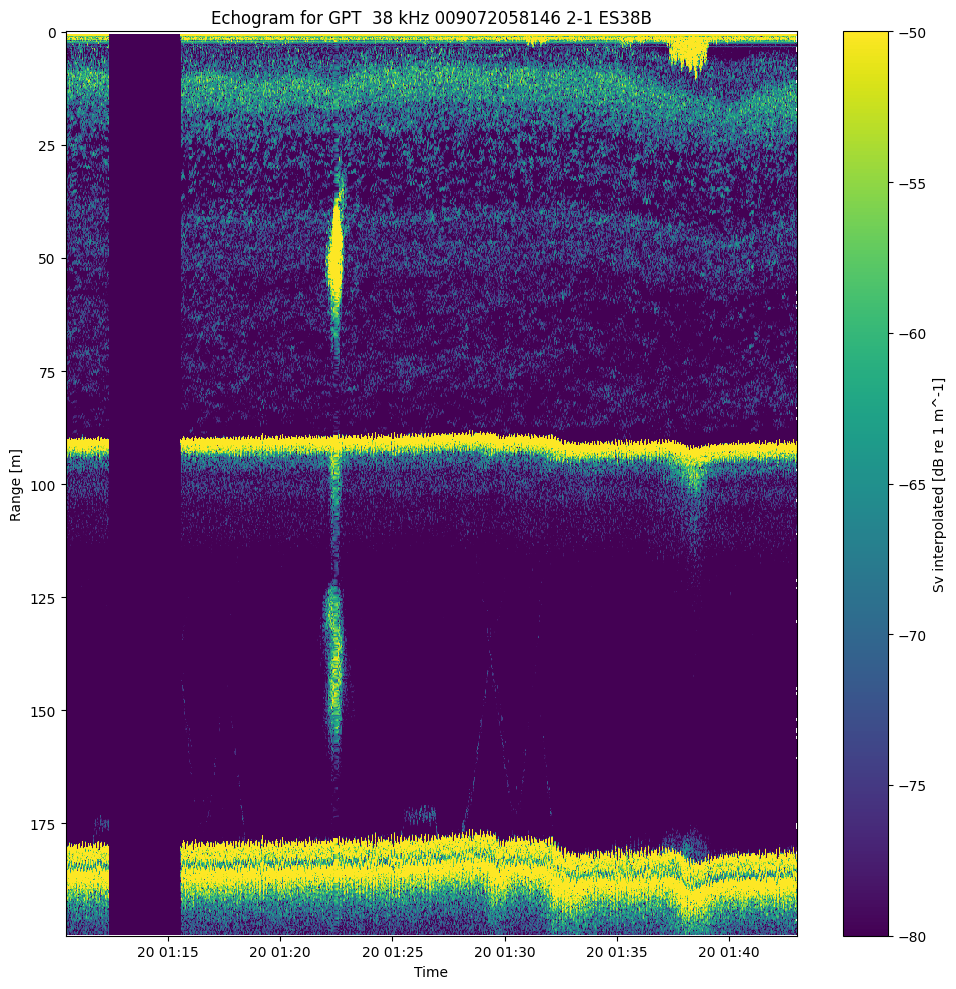

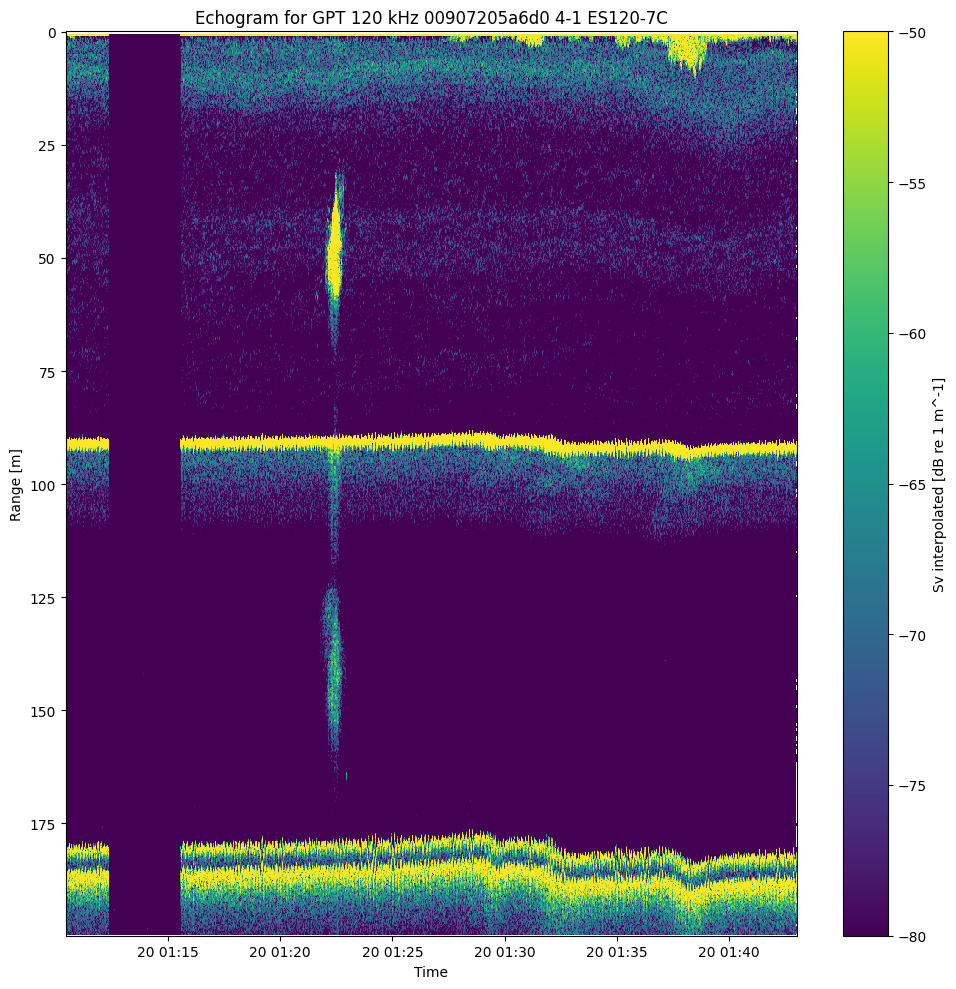

In [27]:
# Select the data from the desired channel
desired_channel = 'GPT  18 kHz 009072058c8d 1-1 ES18-11'
Sv = interpolated_ds['Sv_interpolated'].sel(channel=desired_channel)
ping_time = interpolated_ds['ping_time']
range_sample = interpolated_ds['echo_range'].sel(channel=desired_channel)

# Create the echogram
plt.figure(figsize=(10,10))
plt.pcolormesh(ping_time, range_sample.T, Sv.T, cmap='viridis', vmin=-80, vmax=-50)
plt.gca().invert_yaxis()
plt.colorbar(label='Sv interpolated [dB re 1 m^-1]')
plt.ylabel('Range [m]')
plt.xlabel('Time')
plt.title(f'Echogram for {desired_channel}')
plt.tight_layout()
plt.show()

# Select the data from the desired channel
desired_channel = 'GPT  38 kHz 009072058146 2-1 ES38B'
Sv = interpolated_ds['Sv_interpolated'].sel(channel=desired_channel)
ping_time = interpolated_ds['ping_time']
range_sample = interpolated_ds['echo_range'].sel(channel=desired_channel)

# Create the echogram
plt.figure(figsize=(10,10))
plt.pcolormesh(ping_time, range_sample.T, Sv.T, cmap='viridis', vmin=-80, vmax=-50)
plt.gca().invert_yaxis()
plt.colorbar(label='Sv interpolated [dB re 1 m^-1]')
plt.ylabel('Range [m]')
plt.xlabel('Time')
plt.title(f'Echogram for {desired_channel}')
plt.tight_layout()
plt.show()

# Select the data from the desired channel
desired_channel = 'GPT 120 kHz 00907205a6d0 4-1 ES120-7C'
Sv = interpolated_ds['Sv_interpolated'].sel(channel=desired_channel)
ping_time = interpolated_ds['ping_time']
range_sample = interpolated_ds['echo_range'].sel(channel=desired_channel)

# Create the echogram
plt.figure(figsize=(10,10))
plt.pcolormesh(ping_time, range_sample.T, Sv.T, cmap='viridis', vmin=-80, vmax=-50)
plt.gca().invert_yaxis()
plt.colorbar(label='Sv interpolated [dB re 1 m^-1]')
plt.ylabel('Range [m]')
plt.xlabel('Time')
plt.title(f'Echogram for {desired_channel}')
plt.tight_layout()
plt.show()

In [28]:
# Rename Sv to Sv_denoised
# Rename Sv_interpolated to Sv
interpolated_ds = interpolated_ds.rename({"Sv": "Sv_denoised", "Sv_interpolated": "Sv"})

interpolated_ds

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 1932,
                                    range_sample: 1055, filenames: 1)
Coordinates:
  * channel                        (channel) <U37 'GPT  18 kHz 009072058c8d 1...
  * ping_time                      (ping_time) datetime64[ns] 2017-06-20T01:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 1052 1053 1054
  * filenames                      (filenames) int64 0
Data variables: (12/27)
    Sv_denoised                    (channel, ping_time, range_sample) float64 dask.array<chunksize=(1, 100, 1055), meta=np.ndarray>
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.83 ... -0.34
    ...                             ...
    mask_transient                 (channel, ping_time, range_sample) bool dask.array<chunksize=(1, 100, 1055), meta=np.ndarray>
    mask_attenuation               (channel, ping_time, range_sample) bool Tr...
    mask_impulse                   (channel, ping_time, range_sample) bool Fa...
    mask_false_seabed              (channel, ping_time, range_sample) bool Tr...
    mask_seabed                    (channel, ping_time, range_sample) bool Tr...
    Sv                             (channel, ping_time, range_sample) float64 dask.array<chunksize=(1, 1932, 1055), meta=np.ndarray>
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2333+gc260127
    processing_time:              2023-11-10T07:38:30Z
    processing_function:          calibrate.compute_Sv
    processing_level:             Level 3A
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...
    mask_software_name:           echopype
    mask_software_version:        0.1.dev2333+gc260127
    mask_time:                    2023-11-10T07:43:29Z
    mask_function:                mask.apply_mask

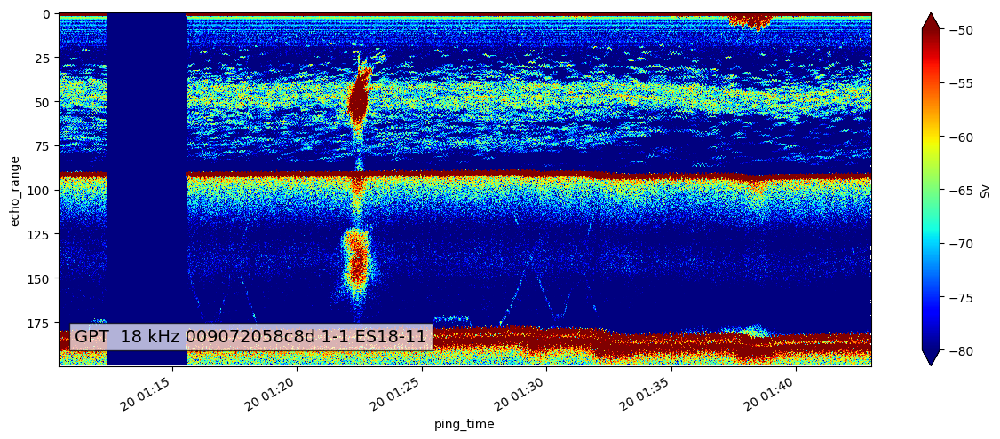

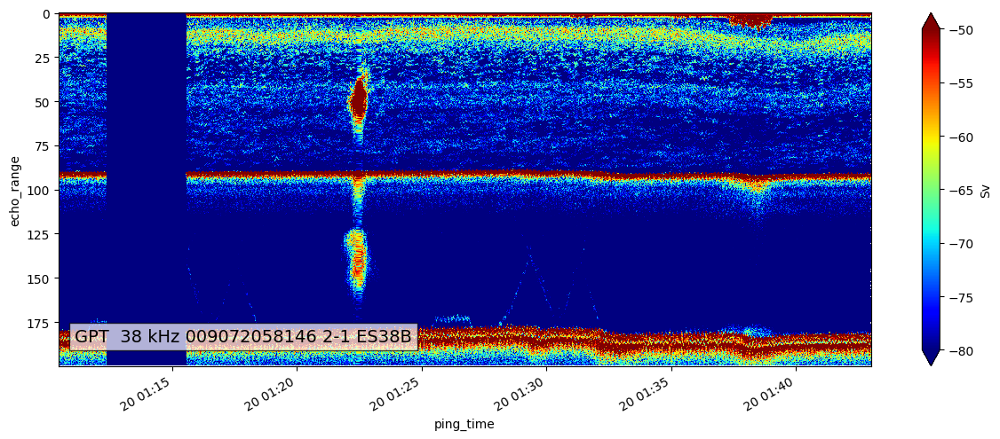

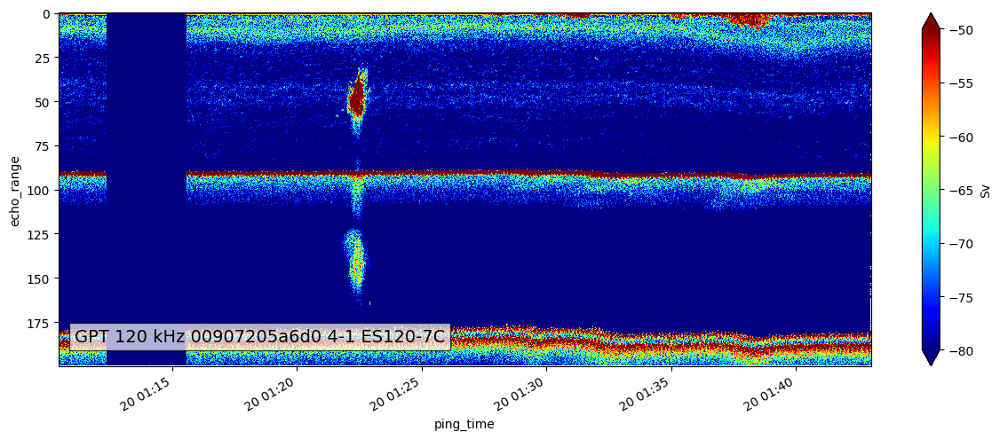

In [29]:
epviz.create_echogram(interpolated_ds,vmin=-80,vmax=-50)

### Remove background noise

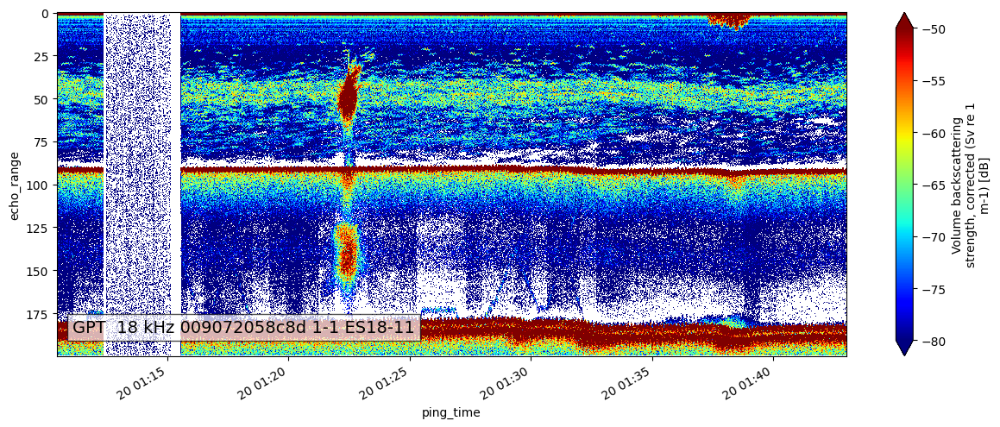

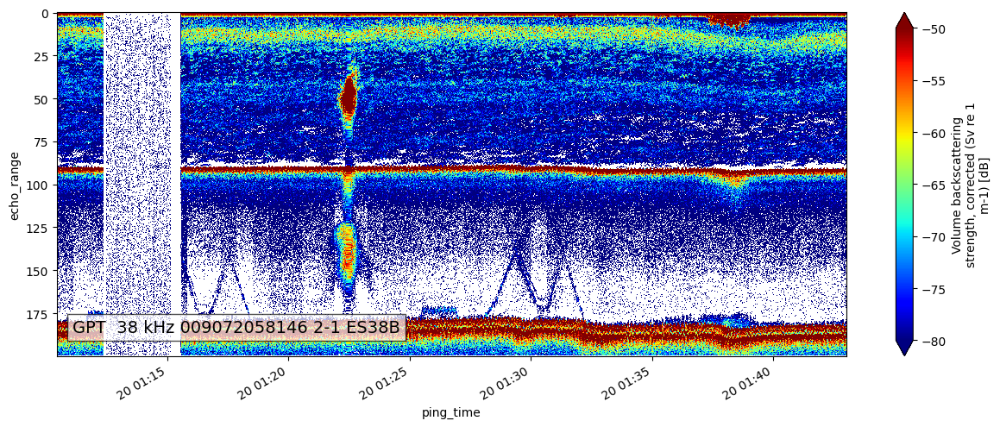

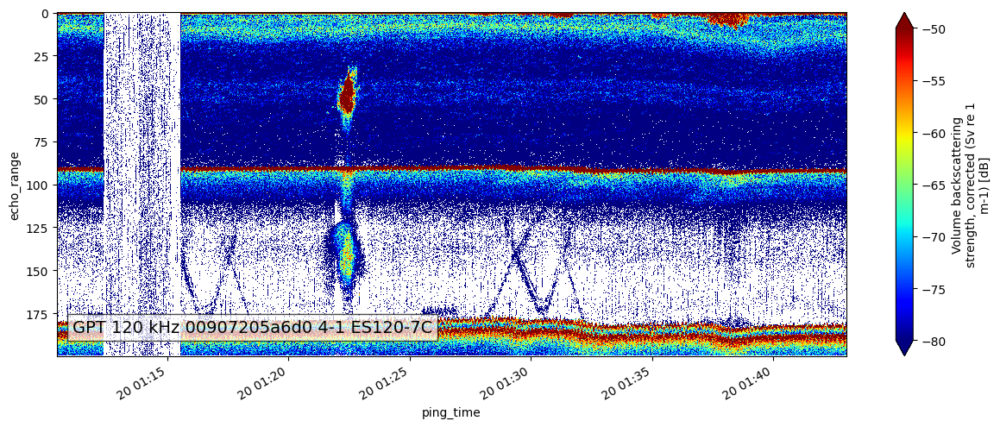

In [30]:
process_parameters = {
        "remove_background_noise": {
        "ping_num": 40,
        "range_sample_num": 10,
        "noise_max": -125,
        "SNR_threshold": 3,
    },

}
interpolated_ds = applying_masks_handler.apply_selected_noise_masks_and_or_noise_removal(
    interpolated_ds, 
    process_parameters
)

epviz.create_echogram(interpolated_ds,vmin=-80,vmax=-50)

### Apply `seabed` and  `false_seabed` masks

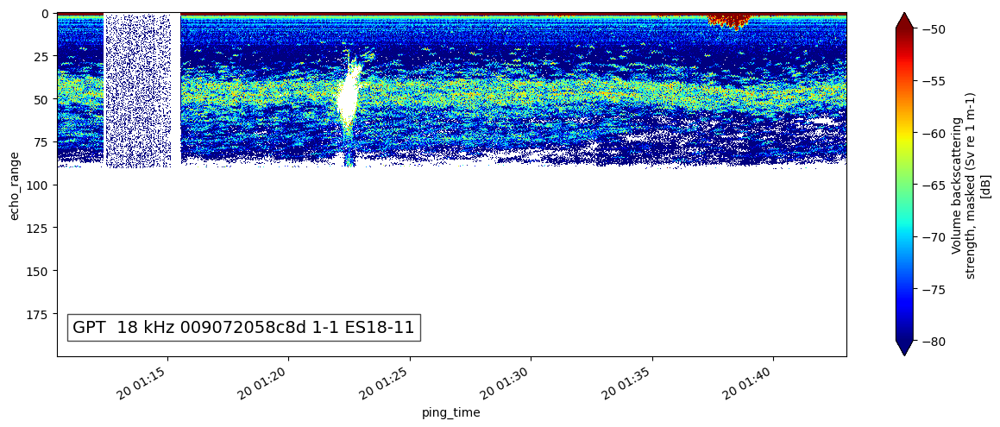

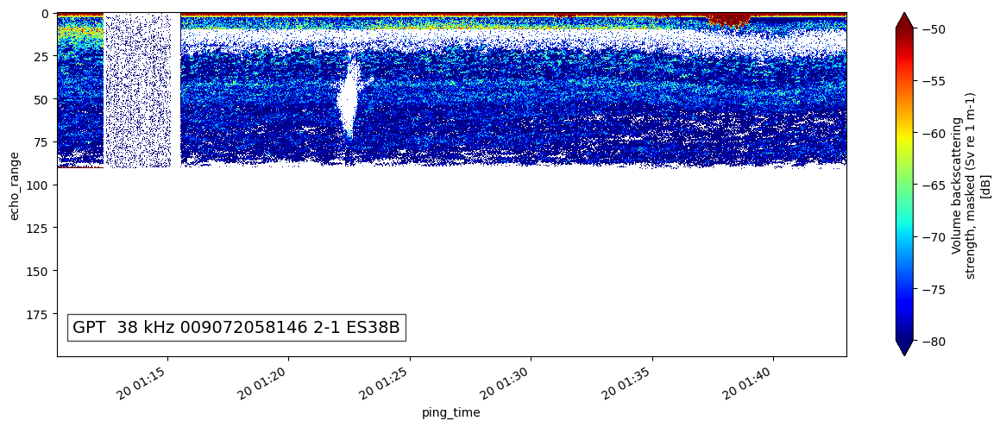

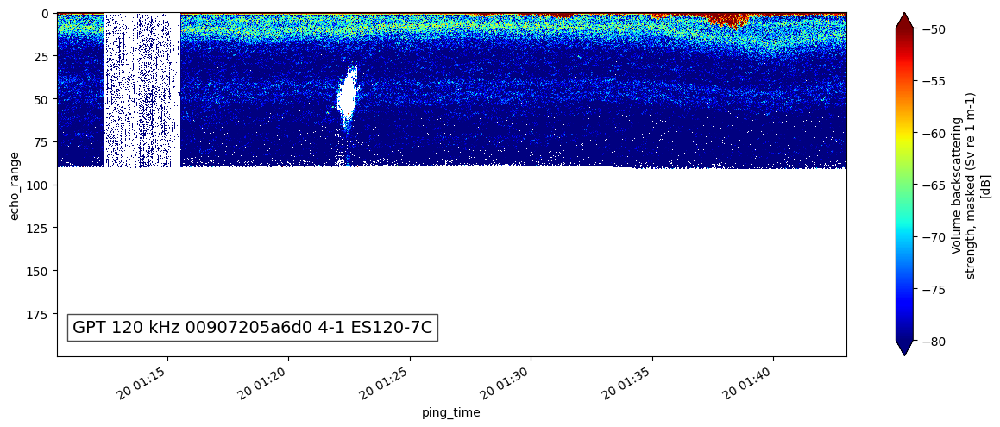

In [31]:
process_parameters = {
    'mask_seabed': {
    'var_name': 'Sv',
    },
    'mask_false_seabed': {
    'var_name': 'Sv',
    }
}

interpolated_ds = applying_masks_handler.apply_selected_noise_masks_and_or_noise_removal(
    interpolated_ds, 
    process_parameters
)

epviz.create_echogram(interpolated_ds,vmin=-80,vmax=-50)

# Compute general NASC

In [32]:
nasc = nasc_computation.compute_per_dataset_nasc(interpolated_ds)
nasc['NASC_dataset']['NASC']

<xarray.DataArray 'NASC' (channel: 3, distance: 1, depth: 1)>
dask.array<mul, shape=(3, 1, 1), dtype=float64, chunksize=(3, 1, 1), chunktype=numpy.ndarray>
Coordinates:
  * distance  (distance) float64 0.0
  * channel   (channel) <U37 'GPT  18 kHz 009072058c8d 1-1 ES18-11' ... 'GPT ...
  * depth     (depth) float64 0.0
Attributes:
    long_name:     Nautical Areal Scattering Coefficient (NASC, m2 nmi-2)
    units:         m2 nmi-2
    actual_range:  [12362971.945, 291680300.407]

### Compute MVBS

In [33]:
interpolated_ds_MVBS = compute_mvbs(
    interpolated_ds, 
    method="physical_units", 
    range_bin="20m", 
    ping_time_bin="20S")
interpolated_ds_MVBS

<xarray.Dataset>
Dimensions:            (channel: 3, ping_time: 99, echo_range: 10)
Coordinates:
  * ping_time          (ping_time) datetime64[ns] 2017-06-20T01:10:20 ... 201...
  * channel            (channel) <U37 'GPT  18 kHz 009072058c8d 1-1 ES18-11' ...
  * echo_range         (echo_range) float64 0.0 20.0 40.0 ... 140.0 160.0 180.0
Data variables:
    Sv                 (channel, ping_time, echo_range) float64 dask.array<chunksize=(3, 99, 10), meta=np.ndarray>
    latitude           (ping_time) float64 44.71 44.71 44.71 ... 44.7 44.7 44.7
    longitude          (ping_time) float64 -124.3 -124.3 ... -124.4 -124.4
    water_level        float64 9.15
    frequency_nominal  (channel) float64 1.8e+04 3.8e+04 1.2e+05
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2333+gc260127
    processing_time:              2023-11-10T07:44:30Z
    processing_function:          commongrid.compute_MVBS
    processing_level:             Level 3B
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...

### Use frequency differencing handler

In [34]:
chan120 = 'GPT 120 kHz 00907205a6d0 4-1 ES120-7C'
chan38 = 'GPT  38 kHz 009072058146 2-1 ES38B'
ds_Sv_with_krill_mask = frequency_differencing_handler.identify_krill(interpolated_ds, chan120=chan120, chan38=chan38)


chan120 = 'GPT 120 kHz 00907205a6d0 4-1 ES120-7C'
chan38 = 'GPT  38 kHz 009072058146 2-1 ES38B'
ds_Sv_with_gas_bearing_organisms_mask = frequency_differencing_handler.identify_gas_bearing_organisms(
    ds_Sv_with_krill_mask,
    chan120=chan120,
    chan38=chan38
)


chan120 = 'GPT 120 kHz 00907205a6d0 4-1 ES120-7C'
chan38 = 'GPT  38 kHz 009072058146 2-1 ES38B'
ds_Sv_with_fluid_like_organisms_mask = frequency_differencing_handler.identify_fluid_like_organisms(
    ds_Sv_with_gas_bearing_organisms_mask,
    chan120=chan120,
    chan38=chan38
)





ds_Sv_with_shoal_combined_mask = shoal_detection_handler.attach_shoal_mask_to_ds(ds_Sv_with_fluid_like_organisms_mask)
ds_Sv_with_shoal_combined_mask


<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 1932,
                                    range_sample: 1055, filenames: 1)
Coordinates:
  * channel                        (channel) object 'GPT  18 kHz 009072058c8d...
  * ping_time                      (ping_time) datetime64[ns] 2017-06-20T01:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 1052 1053 1054
  * filenames                      (filenames) int64 0
Data variables: (12/33)
    Sv_denoised                    (channel, ping_time, range_sample) float64 dask.array<chunksize=(1, 100, 1055), meta=np.ndarray>
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.83 ... -0.34
    ...                             ...
    Sv_noise                       (channel, ping_time, range_sample) float64 dask.array<chunksize=(1, 1920, 1055), meta=np.ndarray>
    Sv                             (channel, ping_time, range_sample) float64 dask.array<chunksize=(1, 1920, 1055), meta=np.ndarray>
    mask_krill                     (ping_time, range_sample) bool dask.array<chunksize=(1920, 1055), meta=np.ndarray>
    mask_gas_bearing_organisms     (ping_time, range_sample) bool dask.array<chunksize=(1920, 1055), meta=np.ndarray>
    mask_fluid_like_organisms      (ping_time, range_sample) bool dask.array<chunksize=(1920, 1055), meta=np.ndarray>
    mask_shoal                     (channel, ping_time, range_sample) bool Fa...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2333+gc260127
    processing_time:              2023-11-10T07:43:56Z
    processing_function:          clean.remove_noise
    processing_level:             Level 3B
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...
    mask_software_name:           echopype
    mask_software_version:        0.1.dev2333+gc260127
    mask_time:                    2023-11-10T07:44:11Z
    mask_function:                mask.apply_mask

### Apply `krill` and `shoal` masks

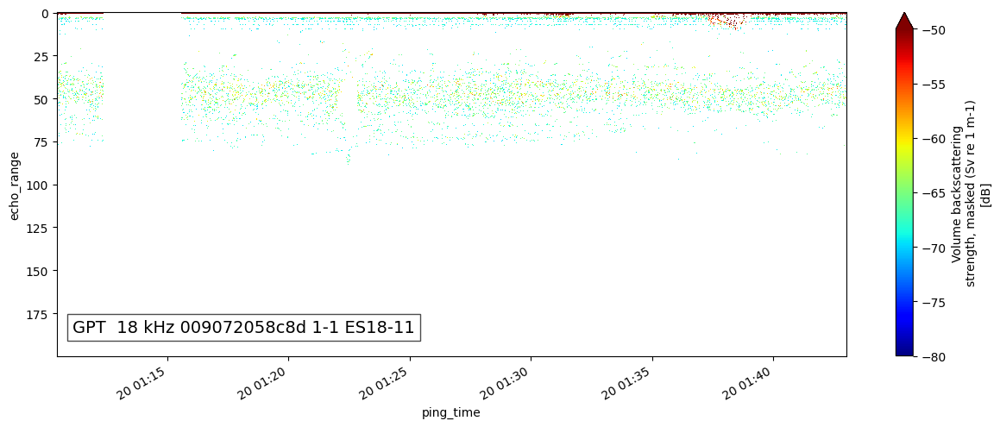

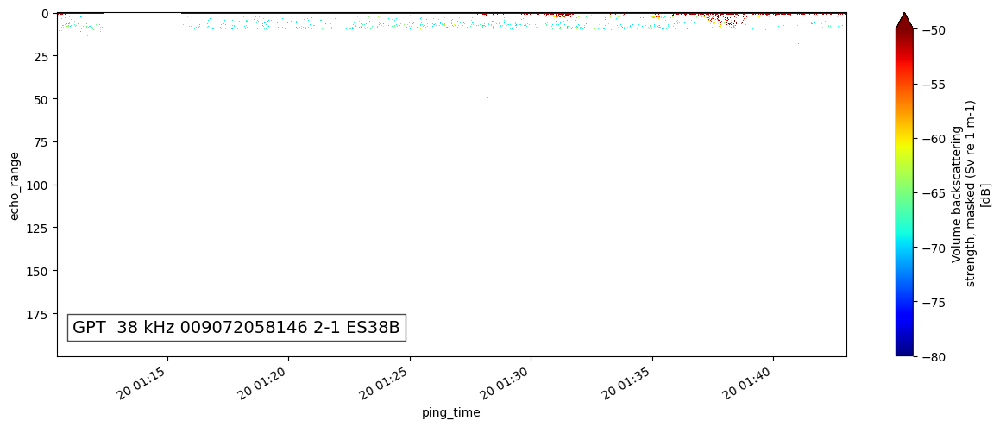

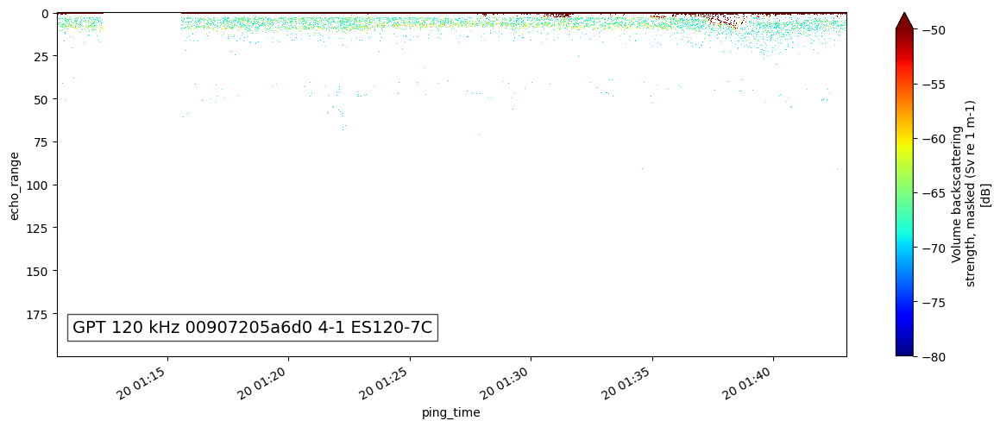

In [35]:
process_parameters = {
    'mask_krill': {
        'var_name': 'Sv',
    },
    'mask_shoal': {
        'var_name': 'Sv',
    }
}

organisms_ds = apply_mask_organisms_in_order(ds_Sv_with_shoal_combined_mask, process_parameters)
epviz.create_echogram(organisms_ds,vmin=-80,vmax=-50)

### Compute krill shoal NASC

In [36]:
krill_nasc = nasc_computation.compute_per_dataset_nasc(organisms_ds)
krill_nasc['NASC_dataset']['NASC']

<xarray.DataArray 'NASC' (channel: 3, distance: 1, depth: 1)>
dask.array<mul, shape=(3, 1, 1), dtype=float64, chunksize=(3, 1, 1), chunktype=numpy.ndarray>
Coordinates:
  * distance  (distance) float64 0.0
  * channel   (channel) object 'GPT  18 kHz 009072058c8d 1-1 ES18-11' ... 'GP...
  * depth     (depth) float64 0.0
Attributes:
    long_name:     Nautical Areal Scattering Coefficient (NASC, m2 nmi-2)
    units:         m2 nmi-2
    actual_range:  [237763863.523, 8147913304.856]

### Save the processed dataset

In [37]:
os.makedirs(os.path.join(oceanstream_tour_path, 'test'), exist_ok=True)
processed_data_io.write_processed(
    sv = organisms_ds,
    file_path = os.path.join(oceanstream_tour_path, 'test'),
    file_name = "test_processed_EK60",
    file_type = "nc",
)

organisms_ds

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 1932,
                                    range_sample: 1055, filenames: 1)
Coordinates:
  * channel                        (channel) object 'GPT  18 kHz 009072058c8d...
  * ping_time                      (ping_time) datetime64[ns] 2017-06-20T01:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 1052 1053 1054
  * filenames                      (filenames) int64 0
Data variables: (12/33)
    Sv_denoised                    (channel, ping_time, range_sample) float64 dask.array<chunksize=(1, 100, 1055), meta=np.ndarray>
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.83 ... -0.34
    ...                             ...
    Sv_noise                       (channel, ping_time, range_sample) float64 dask.array<chunksize=(1, 1920, 1055), meta=np.ndarray>
    Sv                             (channel, ping_time, range_sample) float64 dask.array<chunksize=(1, 1920, 1055), meta=np.ndarray>
    mask_krill                     (ping_time, range_sample) bool dask.array<chunksize=(1920, 1055), meta=np.ndarray>
    mask_gas_bearing_organisms     (ping_time, range_sample) bool dask.array<chunksize=(1920, 1055), meta=np.ndarray>
    mask_fluid_like_organisms      (ping_time, range_sample) bool dask.array<chunksize=(1920, 1055), meta=np.ndarray>
    mask_shoal                     (channel, ping_time, range_sample) bool Fa...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2333+gc260127
    processing_time:              2023-11-10T07:43:56Z
    processing_function:          clean.remove_noise
    processing_level:             Level 3B
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...
    mask_software_name:           echopype
    mask_software_version:        0.1.dev2333+gc260127
    mask_time:                    2023-11-10T07:46:31Z
    mask_function:                mask.apply_mask

### Read the saved dataset

In [38]:
test_ds = processed_data_io.read_processed(
    file_path=os.path.join(
        oceanstream_tour_path, 
        'test',
        'test_processed_EK60.nc'
    )
)
test_ds

<xarray.Dataset>
Dimensions:                        (channel: 3, ping_time: 1932,
                                    range_sample: 1055, filenames: 1)
Coordinates:
  * channel                        (channel) object 'GPT  18 kHz 009072058c8d...
  * ping_time                      (ping_time) datetime64[ns] 2017-06-20T01:1...
  * range_sample                   (range_sample) int64 0 1 2 ... 1052 1053 1054
  * filenames                      (filenames) int64 0
Data variables: (12/33)
    Sv_denoised                    (channel, ping_time, range_sample) float64 ...
    echo_range                     (channel, ping_time, range_sample) float64 ...
    frequency_nominal              (channel) float64 1.8e+04 3.8e+04 1.2e+05
    sound_speed                    (channel, ping_time) float64 1.481e+03 ......
    sound_absorption               (channel, ping_time) float64 0.002822 ... ...
    sa_correction                  (ping_time, channel) float64 -0.83 ... -0.34
    ...                             ...
    Sv_noise                       (channel, ping_time, range_sample) float64 ...
    Sv                             (channel, ping_time, range_sample) float64 ...
    mask_krill                     (ping_time, range_sample) bool False ... F...
    mask_gas_bearing_organisms     (ping_time, range_sample) bool False ... F...
    mask_fluid_like_organisms      (ping_time, range_sample) bool False ... F...
    mask_shoal                     (channel, ping_time, range_sample) bool Fa...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.1.dev2333+gc260127
    processing_time:              2023-11-10T07:43:56Z
    processing_function:          clean.remove_noise
    processing_level:             Level 3B
    processing_level_url:         https://echopype.readthedocs.io/en/stable/p...
    mask_software_name:           echopype
    mask_software_version:        0.1.dev2333+gc260127
    mask_time:                    2023-11-10T07:46:31Z
    mask_function:                mask.apply_mask

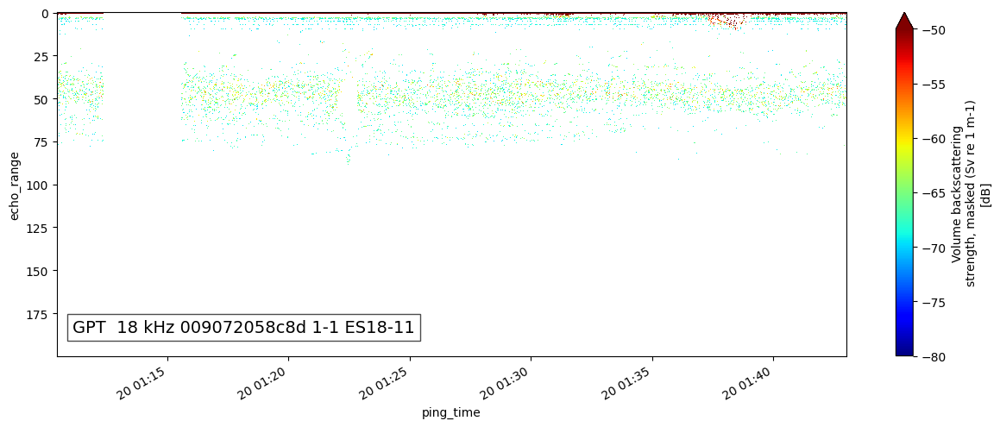

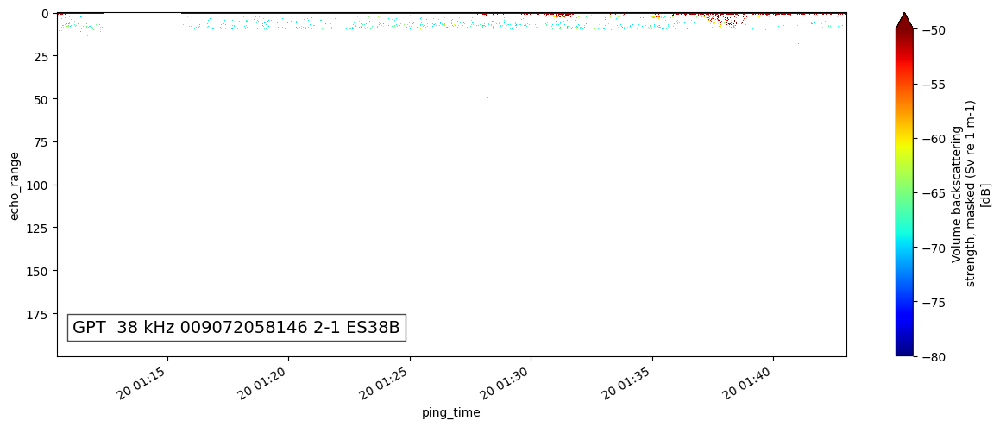

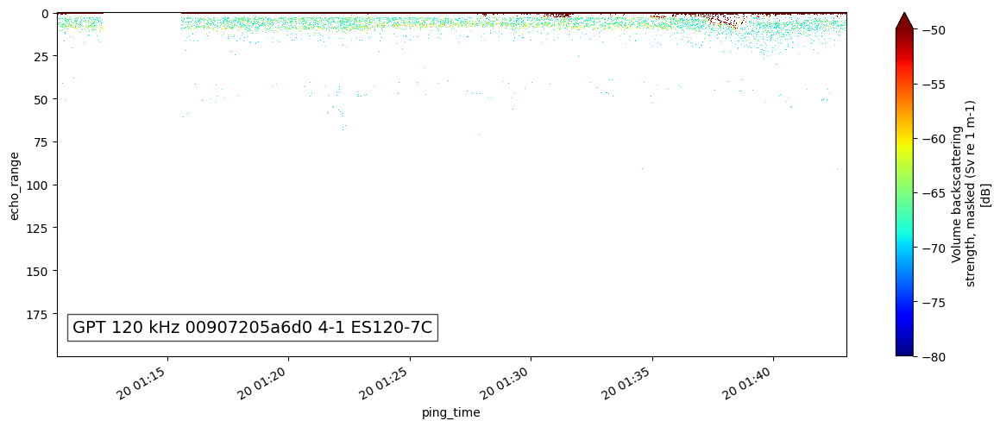

In [39]:
epviz.create_echogram(test_ds,vmin=-80,vmax=-50)